In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Specify the path to the merged CSV file and output folder in Google Drive
csv_file = '/content/drive/My Drive/project/merged_output.csv'  # Path to CSV
output_dir = '/content/drive/My Drive/project/output'  # Output folder
output_plot = os.path.join(output_dir, 'solar_power_timeseries.png')  # Output plot path

# Create output folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created output folder: '{output_dir}'")

# Check if the CSV file exists
if not os.path.isfile(csv_file):
    print(f"Error: File '{csv_file}' does not exist. Please check the path.")
    exit(1)

# Read the CSV file
try:
    df = pd.read_csv(csv_file, sep=';')
    print(f"Loaded '{csv_file}' with {len(df)} rows and {len(df.columns)} columns.")
except Exception as e:
    print(f"Error reading '{csv_file}': {str(e)}")
    exit(1)

# Define key columns for analysis
date_col = 'DD.MM.YYYY hh:mm'
power_col = 'Cluster Controller Cluster Controller 165023614 Metering.PCCMs.PlntW Analog W'  # Index 476
irradiance_col = 'Cluster Controller Cluster Controller 165023614 Env.TotInsol Analog W/m²'  # Index 22
temp_col = 'Cluster Controller Cluster Controller 165023614 Env.TmpVal Analog °C'  # Index 21
health_col = 'Cluster Controller Cluster Controller 165023614 Operation.Health Status'  # Index 34

# Verify columns exist
required_cols = [date_col, power_col, irradiance_col, temp_col, health_col]
missing_cols = [col for col in required_cols if col not in df.columns]
if missing_cols:
    print(f"Error: Missing columns: {missing_cols}")
    exit(1)

# Convert date column to datetime
try:
    df[date_col] = pd.to_datetime(df[date_col], format='%d.%m.%Y %H:%M')
except Exception as e:
    print(f"Error parsing '{date_col}': {str(e)}")
    exit(1)

# Ensure power column is numeric
df[power_col] = pd.to_numeric(df[power_col], errors='coerce')

# Drop rows with missing power or date values
df = df.dropna(subset=[date_col, power_col])
print(f"After dropping missing values, {len(df)} rows remain.")

# Create a time-series plot of total plant power
plt.figure(figsize=(12, 6))
plt.plot(df[date_col], df[power_col], label='Total Plant Power (W)', color='blue')
plt.xlabel('Date and Time')
plt.ylabel('Power (W)')
plt.title('Solar Power Output Over Time')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Save the plot to Google Drive
try:
    plt.savefig(output_plot)
    print(f"Plot saved as '{output_plot}'.")
except Exception as e:
    print(f"Error saving plot: {str(e)}")
plt.close()

# Print basic statistics
print("\nBasic Statistics for Total Plant Power:")
print(df[power_col].describe())

# Print health status counts
print("\nHealth Status Counts:")
print(df[health_col].value_counts())

print("\nAnalysis complete.")

Mounted at /content/drive
Created output folder: '/content/drive/My Drive/project/output'


<ipython-input-1-970c11b0d361>:26: DtypeWarning: Columns (5,11,12,13,19,20,35,36,42,43,44,52,54,55,56,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,77,78,79,80,81,83,84,85,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,106,107,108,109,110,112,113,114,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,135,136,137,138,139,141,142,143,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,164,165,166,167,168,169,170,171,172,173,174,175,176,178,180,181,184,185,186,187,188,189,190,192,194,195,198,199,200,201,202,203,204,206,208,209,212,213,214,215,216,217,218,220,222,223,226,227,228,229,230,231,232,233,235,237,238,241,242,243,244,245,246,247,248,250,252,253,256,257,258,259,260,261,262,263,265,266,267,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,288,289,290,292,294,295,296,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,317,318,319,321,323,324,325,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,

Loaded '/content/drive/My Drive/project/merged_output.csv' with 216590 rows and 476 columns.
Error: Missing columns: ['DD.MM.YYYY hh:mm']
Error parsing 'DD.MM.YYYY hh:mm': 'DD.MM.YYYY hh:mm'


KeyError: ['DD.MM.YYYY hh:mm']

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Specify the path to the merged CSV file and output folder in Google Drive
csv_file = '/content/drive/My Drive/project/merged_output.csv'  # Path to CSV
output_dir = '/content/drive/My Drive/project/output'  # Output folder
output_plot = os.path.join(output_dir, 'solar_power_timeseries.png')  # Output plot path

# Create output folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created output folder: '{output_dir}'")

# Check if the CSV file exists
if not os.path.isfile(csv_file):
    print(f"Error: File '{csv_file}' does not exist. Please check the path.")
    print("Listing files in '/content/drive/My Drive/project':")
    # !ls "/content/drive/My Drive/project"
    exit(1)

# Read the CSV file with low_memory=False to handle mixed types
try:
    df = pd.read_csv(csv_file, sep=';', low_memory=False)
    print(f"Loaded '{csv_file}' with {len(df)} rows and {len(df.columns)} columns.")
except Exception as e:
    print(f"Error reading '{csv_file}': {str(e)}")
    exit(1)

# Print the first 5 column names to confirm
print("\nFirst 5 column names:")
print(df.columns[:5].tolist())

# Define key columns for analysis
date_col = 'DD.MM.YYYY hh:mm '  # Corrected name with trailing space
power_col = 'Cluster Controller Cluster Controller 165023614 Metering.PCCMs.PlntW Analog W'  # Index 476
fallback_power_col = 'Cluster Controller Cluster Controller 165023614 GridMs.TotW Analog W'  # Index 8, fallback
irradiance_col = 'Cluster Controller Cluster Controller 165023614 Env.TotInsol Analog W/m²'  # Index 22
temp_col = 'Cluster Controller Cluster Controller 165023614 Env.TmpVal Analog °C'  # Index 21
health_col = 'Cluster Controller Cluster Controller 165023614 Operation.Health Status'  # Index 34

# Verify columns exist
required_cols = [date_col, power_col, irradiance_col, temp_col, health_col]
missing_cols = [col for col in required_cols if col not in df.columns]
if missing_cols:
    print(f"Error: Missing columns: {missing_cols}")
    exit(1)

# Print first 5 rows of date and power columns to inspect
print(f"\nFirst 5 rows of '{date_col}':")
print(df[date_col].head())
print(f"\nFirst 5 rows of '{power_col}':")
print(df[power_col].head())

# Convert date column to datetime
try:
    df[date_col] = pd.to_datetime(df[date_col], format='%Y-%m-%d %H:%M:%S', errors='coerce')
    print(f"\nMissing values in '{date_col}': {df[date_col].isna().sum()}")
except Exception as e:
    print(f"Error parsing '{date_col}': {str(e)}")
    exit(1)

# Ensure power column is numeric
df[power_col] = pd.to_numeric(df[power_col], errors='coerce')
print(f"Missing values in '{power_col}': {df[power_col].isna().sum()}")

# Check if power column is entirely missing; if so, try fallback
if df[power_col].isna().all():
    print(f"Warning: '{power_col}' is entirely missing. Trying fallback column: '{fallback_power_col}'")
    if fallback_power_col in df.columns:
        power_col = fallback_power_col
        df[power_col] = pd.to_numeric(df[power_col], errors='coerce')
        print(f"Missing values in '{power_col}': {df[power_col].isna().sum()}")
    else:
        print(f"Error: Fallback column '{fallback_power_col}' not found.")
        exit(1)

# Drop rows with missing power or date values
df = df.dropna(subset=[date_col, power_col])
print(f"After dropping missing values, {len(df)} rows remain.")

# Check if any rows remain
if len(df) == 0:
    print("Error: No valid data remains after dropping missing values. Check data quality.")
    exit(1)

# Create a time-series plot of total plant power
plt.figure(figsize=(12, 6))
plt.plot(df[date_col], df[power_col], label='Total Plant Power (W)', color='blue')
plt.xlabel('Date and Time')
plt.ylabel('Power (W)')
plt.title('Solar Power Output Over Time')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Save the plot to Google Drive
try:
    plt.savefig(output_plot)
    print(f"Plot saved as '{output_plot}'.")
except Exception as e:
    print(f"Error saving plot: {str(e)}")
plt.close()

# Print basic statistics
print("\nBasic Statistics for Total Plant Power:")
print(df[power_col].describe())

# Print health status counts
print("\nHealth Status Counts:")
print(df[health_col].value_counts())

print("\nAnalysis complete.")

Mounted at /content/drive
Loaded '/content/drive/My Drive/project/merged_output.csv' with 216590 rows and 476 columns.

First 5 column names:
['DD.MM.YYYY hh:mm ', 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh', 'Cluster Controller Cluster Controller 165023614 Operation.GriSwCnt Counter', 'Cluster Controller Cluster Controller 165023614 Metering.TotOpTms Counter h', 'Cluster Controller Cluster Controller 165023614 Metering.TotFeedTms Counter h']

First 5 rows of 'DD.MM.YYYY hh:mm ':
0    2019-07-01 00:00:00
1    2019-07-01 00:05:00
2    2019-07-01 00:10:00
3    2019-07-01 00:15:00
4    2019-07-01 00:20:00
Name: DD.MM.YYYY hh:mm , dtype: object

First 5 rows of 'Cluster Controller Cluster Controller 165023614 Metering.PCCMs.PlntW Analog W':
0   NaN
1   NaN
2   NaN
3   NaN
4   NaN
Name: Cluster Controller Cluster Controller 165023614 Metering.PCCMs.PlntW Analog W, dtype: float64

Missing values in 'DD.MM.YYYY hh:mm ': 0
Missing values in 'Cluster Controll

**Energy produced increase**

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Specify paths
csv_file = '/content/drive/My Drive/project/merged_output.csv'  # Path to CSV
output_dir = '/content/drive/My Drive/project/output'  # Output folder
output_plot = os.path.join(output_dir, 'energy_timeseries_resampled.html')  # Output HTML plot

# Create output folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created output folder: '{output_dir}'")

# Load the CSV to ensure full dataset
if not os.path.isfile(csv_file):
    print(f"Error: File '{csv_file}' does not exist. Please check the path.")
    print("Listing files in '/content/drive/My Drive/project':")
    # !ls "/content/drive/My Drive/project"
    exit(1)
try:
    df = pd.read_csv(csv_file, sep=';', decimal=',', header=0, low_memory=False)
    print(f"Loaded '{csv_file}' with {len(df)} rows and {len(df.columns)} columns.")
except Exception as e:
    print(f"Error reading '{csv_file}': {str(e)}")
    exit(1)

# Define columns
date_col = 'DD.MM.YYYY hh:mm '  # Date column with trailing space
energy_col = 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh'  # Energy column

# Verify columns exist
required_cols = [date_col, energy_col]
missing_cols = [col for col in required_cols if col not in df.columns]
if missing_cols:
    print(f"Error: Missing columns: {missing_cols}")
    exit(1)

# Convert date column to datetime
try:
    df[date_col] = pd.to_datetime(df[date_col], format='%Y-%m-%d %H:%M:%S', errors='coerce')
    print(f"Missing values in '{date_col}': {df[date_col].isna().sum()}")
except Exception as e:
    print(f"Error parsing '{date_col}': {str(e)}")
    exit(1)

# Ensure energy column is numeric
df[energy_col] = pd.to_numeric(df[energy_col], errors='coerce')
print(f"Missing values in '{energy_col}': {df[energy_col].isna().sum()}")

# Set date column as index for resampling
df.set_index(date_col, inplace=True)

# Resample to hourly frequency, taking the max energy value per hour (since it's cumulative)
df_resampled = df[[energy_col]].resample('H').max()
print(f"After resampling to hourly frequency, {len(df_resampled)} rows remain.")

# Reset index to make date a column again
df_resampled.reset_index(inplace=True)

# Drop rows with missing values after resampling
df_plot = df_resampled.dropna(subset=[date_col, energy_col])
print(f"After dropping missing values, {len(df_plot)} rows remain for plotting.")

# Check if any rows remain
if len(df_plot) == 0:
    print("Error: No valid data remains for plotting. Check data quality in 'Metering.TotWhOut Counter kWh'.")
    print(f"Sample of '{energy_col}' (raw values after resampling):")
    print(df_resampled[energy_col].head(10))
    exit(1)

# Create interactive plot with Plotly
fig = px.line(
    df_plot,
    x=date_col,
    y=energy_col,
    title='Total Energy Output Over Time (Hourly)',
    labels={
        date_col: 'Date and Time',
        energy_col: 'Total Energy Output (kWh)'
    },
    render_mode='webgl'  # Use WebGL for better performance with large datasets
)

# Update layout for better readability
fig.update_traces(
    line=dict(width=1),  # Thinner line for clarity
    hovertemplate='<b>Date</b>: %{x}<br><b>Energy (kWh)</b>: %{y:.2f}<extra></extra>'
)
fig.update_layout(
    xaxis_title='Date and Time',
    yaxis_title='Total Energy Output (kWh)',
    hovermode='x unified',
    showlegend=True,
    template='plotly'
)

# Save the plot as an interactive HTML file
try:
    pio.write_html(fig, file=output_plot, auto_open=False)
    print(f"Interactive plot saved as '{output_plot}'.")
except Exception as e:
    print(f"Error saving plot: {str(e)}")
    exit(1)

# Display the plot in Colab
fig.show()

print("\nPlotting complete.")

Mounted at /content/drive
Loaded '/content/drive/My Drive/project/merged_output.csv' with 216590 rows and 476 columns.
Missing values in 'DD.MM.YYYY hh:mm ': 0
Missing values in 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh': 1298
After resampling to hourly frequency, 29756 rows remain.
After dropping missing values, 18016 rows remain for plotting.


<ipython-input-6-6930fa5ffefc>:60: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



Interactive plot saved as '/content/drive/My Drive/project/output/energy_timeseries_resampled.html'.



Plotting complete.


**polynomial regression**

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio
import os
from google.colab import drive
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from datetime import datetime, timedelta

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Specify paths
csv_file = '/content/drive/My Drive/project/merged_output.csv'  # Path to CSV
output_dir = '/content/drive/My Drive/project/output'  # Output folder
output_plot = os.path.join(output_dir, 'energy_forecast_to_2040.html')  # Output HTML plot

# Create output folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created output folder: '{output_dir}'")

# Load the CSV to ensure full dataset
if not os.path.isfile(csv_file):
    print(f"Error: File '{csv_file}' does not exist. Please check the path.")
    print("Listing files in '/content/drive/My Drive/project':")
    # !ls "/content/drive/My Drive/project"
    exit(1)
try:
    df = pd.read_csv(csv_file, sep=';', decimal=',', header=0, low_memory=False)
    print(f"Loaded '{csv_file}' with {len(df)} rows and {len(df.columns)} columns.")
except Exception as e:
    print(f"Error reading '{csv_file}': {str(e)}")
    exit(1)

# Define columns
date_col = 'DD.MM.YYYY hh:mm '  # Date column with trailing space
energy_col = 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh'  # Energy column

# Verify columns exist
required_cols = [date_col, energy_col]
missing_cols = [col for col in required_cols if col not in df.columns]
if missing_cols:
    print(f"Error: Missing columns: {missing_cols}")
    exit(1)

# Convert date column to datetime
try:
    df[date_col] = pd.to_datetime(df[date_col], format='%Y-%m-%d %H:%M:%S', errors='coerce')
    print(f"Missing values in '{date_col}': {df[date_col].isna().sum()}")
except Exception as e:
    print(f"Error parsing '{date_col}': {str(e)}")
    exit(1)

# Ensure energy column is numeric
df[energy_col] = pd.to_numeric(df[energy_col], errors='coerce')
print(f"Missing values in '{energy_col}': {df[energy_col].isna().sum()}")

# Set date column as index for resampling
df.set_index(date_col, inplace=True)

# Resample to daily frequency, taking the max energy value (cumulative)
df_daily = df[[energy_col]].resample('D').max()
print(f"After resampling to daily frequency, {len(df_daily)} rows remain.")

# Reset index to make date a column again
df_daily.reset_index(inplace=True)

# Drop rows with missing values
df_daily = df_daily.dropna(subset=[date_col, energy_col])
print(f"After dropping missing values, {len(df_daily)} rows remain for modeling.")

# Check if any rows remain
if len(df_daily) == 0:
    print("Error: No valid data remains for modeling. Check data quality in 'Metering.TotWhOut Counter kWh'.")
    print(f"Sample of '{energy_col}' (raw values after resampling):")
    print(df_daily[energy_col].head(10))
    exit(1)

# Prepare data for ML
# Convert dates to numeric (days since start) for regression
start_date = df_daily[date_col].min()
df_daily['days_since_start'] = (df_daily[date_col] - start_date).dt.total_seconds() / (3600 * 24)  # Days as float

# Features (X) and target (y)
X = df_daily[['days_since_start']]
y = df_daily[energy_col]

# Apply Polynomial Features (degree 2 for a curved trend)
poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

# Train Polynomial Regression model
model = LinearRegression()
model.fit(X_poly, y)

# Generate future dates up to 2040 (May 25, 2040, 14:50 SAST)
end_date = datetime(2040, 5, 25, 14, 50)  # Based on current date: May 25, 2025, 02:56 PM SAST
future_dates = pd.date_range(start=df_daily[date_col].max(), end=end_date, freq='D')
future_days = [(date - start_date).total_seconds() / (3600 * 24) for date in future_dates]  # Days as float
X_future = pd.DataFrame({'days_since_start': future_days})
X_future_poly = poly_features.transform(X_future)

# Predict future energy values
y_future = model.predict(X_future_poly)

# Combine historical and forecasted data
historical_data = pd.DataFrame({
    date_col: df_daily[date_col],
    energy_col: y,
    'Type': 'Historical'
})
forecast_data = pd.DataFrame({
    date_col: future_dates,
    energy_col: y_future,
    'Type': 'Forecast'
})
df_plot = pd.concat([historical_data, forecast_data], ignore_index=True)

# Create interactive plot with Plotly
fig = px.line(
    df_plot,
    x=date_col,
    y=energy_col,
    color='Type',
    title='Total Energy Output Forecast to 2040',
    labels={
        date_col: 'Date and Time',
        energy_col: 'Total Energy Output (kWh)'
    },
    render_mode='webgl'
)

# Update layout for better readability
fig.update_traces(
    line=dict(width=1),
    hovertemplate='<b>Date</b>: %{x}<br><b>Energy (kWh)</b>: %{y:.2f}<br><b>Type</b>: %{customdata}<extra></extra>',
    customdata=df_plot['Type']
)
fig.update_layout(
    xaxis_title='Date and Time',
    yaxis_title='Total Energy Output (kWh)',
    hovermode='x unified',
    showlegend=True,
    template='plotly'
)

# Add a vertical line to mark the end of historical data
fig.add_vline(
    x=df_daily[date_col].max(),  # Use Timestamp directly
    line_dash="dash",
    line_color="red",
    annotation_text="End of Historical Data",
    annotation_position="top right"
)

# Save the plot as an interactive HTML file
try:
    pio.write_html(fig, file=output_plot, auto_open=False)
    print(f"Interactive plot saved as '{output_plot}'.")
except Exception as e:
    print(f"Error saving plot: {str(e)}")
    exit(1)

# Display the plot in Colab
fig.show()

print("\nForecasting complete.")

Mounted at /content/drive
Loaded '/content/drive/My Drive/project/merged_output.csv' with 216590 rows and 476 columns.
Missing values in 'DD.MM.YYYY hh:mm ': 0
Missing values in 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh': 1298
After resampling to daily frequency, 1240 rows remain.
After dropping missing values, 799 rows remain for modeling.


TypeError: Addition/subtraction of integers and integer-arrays with Timestamp is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`

**forecasting with prophet**

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio
import os
from google.colab import drive
from prophet import Prophet

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Specify paths
csv_file = '/content/drive/My Drive/project/merged_output.csv'
output_dir = '/content/drive/My Drive/project/output'
output_plot = os.path.join(output_dir, 'extended_energy_timeseries.html')

# Create output folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created output folder: '{output_dir}'")

# Load the CSV
df = pd.read_csv(csv_file, sep=';', decimal=',', header=0, low_memory=False)

# Define columns
date_col = 'DD.MM.YYYY hh:mm '
energy_col = 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh'

# Convert date column to datetime
df[date_col] = pd.to_datetime(df[date_col], format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Ensure energy column is numeric
df[energy_col] = pd.to_numeric(df[energy_col], errors='coerce')

# Set date column as index for resampling
df.set_index(date_col, inplace=True)

# Resample to hourly frequency
df_resampled = df[[energy_col]].resample('h').max().reset_index()

# Drop missing values
df_resampled.dropna(inplace=True)

# Rename columns for Prophet
df_resampled.columns = ['ds', 'y']

# Initialize and train the Prophet model
model = Prophet()
model.fit(df_resampled)

# Create a future dataframe until 2040
last_date = df_resampled['ds'].max()
forecast_horizon = (pd.Timestamp('2040-01-01') - last_date).days * 24  # Hours till 2040
future = model.make_future_dataframe(periods=forecast_horizon, freq='h')

# Forecast future energy output
forecast = model.predict(future)

# Combine historical and forecasted data
forecast[['yhat']] = forecast[['yhat']].clip(lower=0)  # Ensure no negative predictions
df_forecast = forecast[['ds', 'yhat']]
df_forecast.rename(columns={'yhat': 'Total Energy Output (kWh)'}, inplace=True)

# Merge historical data with forecast
df_combined = pd.concat([
    df_resampled.rename(columns={'y': 'Total Energy Output (kWh)'}),
    df_forecast[df_forecast['ds'] > last_date]
], ignore_index=True)

# Create an interactive plot
fig = px.line(
    df_combined,
    x='ds',
    y='Total Energy Output (kWh)',
    title='Total Energy Output Over Time (Extended to 2040)',
    labels={'ds': 'Date and Time', 'Total Energy Output (kWh)': 'Energy (kWh)'},
    render_mode='webgl'
)

# Save the plot as an interactive HTML file
pio.write_html(fig, file=output_plot, auto_open=False)

# Display the plot in Colab
fig.show()

print(f"Interactive plot saved as '{output_plot}'.")


Mounted at /content/drive


DEBUG:cmdstanpy:input tempfile: /tmp/tmpgvyiw6r0/_on72__a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpgvyiw6r0/hdv769k4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44673', 'data', 'file=/tmp/tmpgvyiw6r0/_on72__a.json', 'init=/tmp/tmpgvyiw6r0/hdv769k4.json', 'output', 'file=/tmp/tmpgvyiw6r0/prophet_modeloe8xrtts/prophet_model-20250525133555.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:35:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:36:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-12-6697960c85ac>:61: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retur

Interactive plot saved as '/content/drive/My Drive/project/output/extended_energy_timeseries.html'.


In [ ]:
import pandas as pd
import plotly.express as px
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Specify paths
csv_file = '/content/drive/My Drive/project/merged_output.csv'
output_dir = '/content/drive/My Drive/project/output'
output_plot = os.path.join(output_dir, 'grid_frequency_timeseries.html')

# Create output folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created output folder: '{output_dir}'")

# Load the CSV
df = pd.read_csv(csv_file, sep=';', decimal=',', header=0, low_memory=False)

# Define columns
date_col = 'DD.MM.YYYY hh:mm '
freq_col = 'Cluster Controller Cluster Controller 165023614 GridMs.Hz Analog Hz'

# Check if columns exist
if date_col not in df.columns or freq_col not in df.columns:
    print(f"Error: Required columns '{date_col}' or '{freq_col}' are missing.")
    exit(1)

# Convert date column to datetime
df[date_col] = pd.to_datetime(df[date_col], format='%Y-%m-%d %H:%M:%S', errors='coerce')

# Ensure frequency column is numeric
df[freq_col] = pd.to_numeric(df[freq_col], errors='coerce')

# Drop rows with missing values
df_clean = df.dropna(subset=[date_col, freq_col])

# Sort by date
df_clean.sort_values(by=date_col, inplace=True)

# Create a line plot
fig = px.line(
    df_clean,
    x=date_col,
    y=freq_col,
    title='Grid Frequency Over Time',
    labels={
        date_col: 'Date and Time',
        freq_col: 'Grid Frequency (Hz)'
    },
    render_mode='webgl'  # Optimized rendering for large datasets
)

# Save the plot as an interactive HTML file
fig.write_html(output_plot, auto_open=False)

# Display the plot in Colab
fig.show()

print(f"Interactive plot saved as '{output_plot}'.")


Mounted at /content/drive


<ipython-input-13-a8cee20c44fb>:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Interactive plot saved as '/content/drive/My Drive/project/output/grid_frequency_timeseries.html'.


**monthly yield**

Column names in CSV: ['Month', '2019', '2020', '2021', '2024', '2025']
Yields data: [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9953.52, 11707.53, 12319.68, 11668.04, 10624.36, 11145.81], [11595.51, 9476.0, 12136.73, 10091.81, 13146.06, 10664.92, 12314.97, 11920.05, 10186.51, 10728.59, 10703.93, 11631.24], [10397.23, 8241.8, 12083.97, 11064.23, 10488.75, 3188.57, 5114.98, 3390.15, 0.0, 4645.2, 8402.7, 6772.22], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1579.73, 3797.17, 4188.68, 3130.59, 1216.71], [2466.84, 5039.1, 7983.76, 6141.48, 5379.4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]


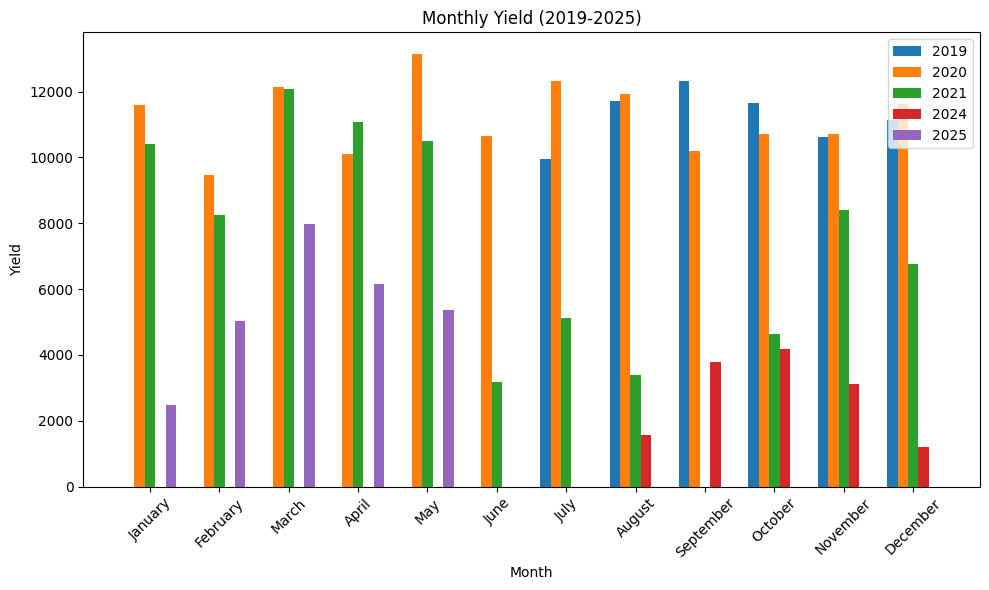

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive (already mounted, so no need to remount unless forced)
# drive.mount('/content/drive')  # Uncomment and set force_remount=True if needed

# Load the CSV file from the specified path in Drive
df = pd.read_csv('/content/drive/My Drive/project/output/monthly_yield.csv')

# Print column names to debug
print("Column names in CSV:", df.columns.tolist())

# Replace any NaN values with 0
df.fillna(0, inplace=True)

# Remove commas from numeric columns and convert to float
for year in ['2019', '2020', '2021', '2024', '2025']:
    df[year] = df[year].astype(str).str.replace(',', '').astype(float)

# Data for plotting
months = df['Month']
years = ['2019', '2020', '2021', '2024', '2025']
yields = [df[year].tolist() for year in years]

# Print the yields to debug
print("Yields data:", yields)

# Set the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Create bar graph
bar_width = 0.15  # Reduced bar width to fit all years
index = range(len(months))

for i, (year, yield_data) in enumerate(zip(years, yields)):
    plt.bar([j + i * bar_width for j in index], yield_data, bar_width, label=year)

# Customize the plot
plt.xlabel('Month')
plt.ylabel('Yield')
plt.title('Monthly Yield (2019-2025)')
plt.xticks([j + bar_width * 2 for j in index], months, rotation=45)
plt.legend()
plt.tight_layout()

# Show the plot
plt.show()

**Training**

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio
import os
from google.colab import drive
from datetime import datetime
from prophet import Prophet
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Specify paths
csv_file = '/content/drive/My Drive/project/merged_output.csv'  # Path to CSV
output_dir = '/content/drive/My Drive/project/output'  # Output folder
output_plot = os.path.join(output_dir, 'energy_forecast_prophet_lstm_full_period.html')  # Output HTML plot

# Create output folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created output folder: '{output_dir}'")

# Load the CSV
try:
    df = pd.read_csv(csv_file, sep=';', decimal=',', header=0, low_memory=False)
    print(f"Loaded '{csv_file}' with {len(df)} rows and {len(df.columns)} columns.")
except Exception as e:
    print(f"Error reading '{csv_file}': {str(e)}")
    exit(1)

# Define columns
date_col = 'DD.MM.YYYY hh:mm '
energy_col = 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh'
irradiance_col = 'Cluster Controller Cluster Controller 165023614 Env.TotInsol Analog W/m²'
temp_col = 'Cluster Controller Cluster Controller 165023614 Env.TmpVal Analog °C'

# Verify columns exist
required_cols = [date_col, energy_col, irradiance_col, temp_col]
missing_cols = [col for col in required_cols if col not in df.columns]
if missing_cols:
    print(f"Error: Missing columns: {missing_cols}")
    exit(1)

# Convert date column to datetime
df[date_col] = pd.to_datetime(df[date_col], format='%Y-%m-%d %H:%M:%S', errors='coerce')
print(f"Missing values in '{date_col}': {df[date_col].isna().sum()}")

# Convert numeric columns
df[energy_col] = pd.to_numeric(df[energy_col], errors='coerce')
df[irradiance_col] = pd.to_numeric(df[irradiance_col], errors='coerce')
df[temp_col] = pd.to_numeric(df[temp_col], errors='coerce')
print(f"Missing values in '{energy_col}': {df[energy_col].isna().sum()}")
print(f"Missing values in '{irradiance_col}': {df[irradiance_col].isna().sum()}")
print(f"Missing values in '{temp_col}': {df[temp_col].isna().sum()}")

# Set date column as index for resampling, then reset to keep as column
df.set_index(date_col, inplace=True)
df_daily = df[[energy_col, irradiance_col, temp_col]].resample('D').agg({
    energy_col: 'max',
    irradiance_col: 'mean',
    temp_col: 'mean'
})
df_daily.reset_index(inplace=True)  # Reset index to restore date_col
print(f"After resampling to daily frequency, {len(df_daily)} rows remain.")

# Handle missing values
df_daily[energy_col] = df_daily[energy_col].fillna(0)  # Replace missing energy with 0
df_daily[irradiance_col] = df_daily[irradiance_col].interpolate(method='linear').fillna(df_daily[irradiance_col].mean())
df_daily[temp_col] = df_daily[temp_col].interpolate(method='linear').fillna(df_daily[temp_col].mean())
print(f"After handling missing values, {len(df_daily)} rows remain.")

# Check if any rows remain
if len(df_daily) == 0:
    print("Error: No valid data remains for modeling.")
    exit(1)

# Compute daily production with moving average to reduce noise
window_size = 7  # 7-day moving average
df_daily['daily_production'] = df_daily[energy_col].diff().fillna(0).rolling(window=window_size, center=True).mean()
# Fill NaNs at the edges caused by the moving average
df_daily['daily_production'] = df_daily['daily_production'].interpolate(method='linear').fillna(method='ffill').fillna(method='bfill')
df_daily['daily_production'] = df_daily['daily_production'].clip(lower=0)  # Ensure no negative production

# --- Prophet Model ---
# Prepare data for Prophet (using daily production)
df_prophet = pd.DataFrame({
    'ds': df_daily[date_col],
    'y': df_daily['daily_production'],
    'irradiance': df_daily[irradiance_col],
    'temp': df_daily[temp_col]
})

# Add capacity (optional, but not used with linear growth)
capacity = df_daily['daily_production'].max() * 1.5
df_prophet['cap'] = capacity  # Keep for consistency

# Debug: Check columns and NaNs
print("Prophet DataFrame columns:", df_prophet.columns.tolist())
print("NaNs in Prophet DataFrame:\n", df_prophet.isna().sum())

# Train on the first 80% of the data
train_size = int(len(df_prophet) * 0.8)  # Use first 80% for training
train_prophet = df_prophet.iloc[:train_size].copy()

# Initialize and train Prophet model with linear growth
prophet_model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False, growth='linear')
prophet_model.add_regressor('irradiance')
prophet_model.add_regressor('temp')
prophet_model.fit(train_prophet)

# Predict over the entire period (historical + future)
end_date = datetime(2030, 5, 25, 19, 32)  # May 25, 2030, 19:32 SAST
all_dates = pd.date_range(start=df_daily[date_col].min(), end=end_date, freq='D')
future_df = pd.DataFrame({'ds': all_dates})
future_df.set_index('ds', inplace=True)  # Set ds as index for reindexing
future_df['irradiance'] = df_daily.set_index(date_col)[irradiance_col].reindex(future_df.index, method='ffill').fillna(df_daily[irradiance_col].mean())
future_df['temp'] = df_daily.set_index(date_col)[temp_col].reindex(future_df.index, method='ffill').fillna(df_daily[temp_col].mean())
future_df['cap'] = capacity  # Include for consistency
future_df.reset_index(inplace=True)  # Reset index for Prophet prediction

prophet_pred = prophet_model.predict(future_df)['yhat']

# Integrate to get cumulative energy, starting from the first cumulative value
first_cumulative = df_daily[energy_col].iloc[0]
prophet_forecast_cumulative = np.cumsum(prophet_pred) + first_cumulative
prophet_forecast_cumulative = np.maximum.accumulate(prophet_forecast_cumulative)  # Ensure non-decreasing

# Evaluate Prophet on historical period
historical_dates = df_daily[date_col]
historical_pred = prophet_model.predict(df_prophet[df_prophet['ds'].isin(historical_dates)])['yhat']
historical_true = df_daily['daily_production'].values
mae_prophet = mean_absolute_error(historical_true, historical_pred)
mse_prophet = mean_squared_error(historical_true, historical_pred)
r2_prophet = r2_score(historical_true, historical_pred)
print("\nProphet Model Evaluation (Daily Production - Entire Historical Period):")
print(f"MAE: {mae_prophet:.2f} kWh")
print(f"MSE: {mse_prophet:.2f} kWh²")
print(f"R²: {r2_prophet:.2f}")

# --- LSTM Model ---
# Prepare data for LSTM (using daily production)
scaler_features = MinMaxScaler()
scaled_data = scaler_features.fit_transform(df_daily[[energy_col, irradiance_col, temp_col]])
scaled_df = pd.DataFrame(scaled_data, columns=[energy_col, irradiance_col, temp_col], index=df_daily.index)

scaler_target = MinMaxScaler()  # Separate scaler for target
y_scaled = scaler_target.fit_transform(df_daily['daily_production'].values.reshape(-1, 1)).ravel()

# Create sequences for LSTM (daily production)
sequence_length = 60
X_lstm, y_lstm = [], []
for i in range(sequence_length, len(df_daily)):
    X_lstm.append(scaled_df.iloc[i-sequence_length:i].values)
    y_lstm.append(y_scaled[i])
X_lstm, y_lstm = np.array(X_lstm), np.array(y_lstm)

# Train on the first 80% of the sequences
train_size_lstm = int(len(X_lstm) * 0.8)
X_train_lstm = X_lstm[:train_size_lstm]
y_train_lstm = y_lstm[:train_size_lstm]

# Build and train LSTM model
lstm_model = Sequential()
lstm_model.add(LSTM(50, return_sequences=True, input_shape=(sequence_length, 3)))
lstm_model.add(Dropout(0.2))
lstm_model.add(LSTM(50, return_sequences=False))
lstm_model.add(Dropout(0.2))
lstm_model.add(Dense(25))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
lstm_model.fit(X_train_lstm, y_train_lstm, epochs=30, batch_size=32, verbose=1)

# Predict over the entire period (historical + future)
lstm_pred_scaled = []
current_sequence = scaled_df.iloc[:sequence_length].values  # Start with the first sequence
total_steps = len(all_dates) - sequence_length  # Total steps to predict
for i in range(total_steps):
    current_sequence_reshaped = current_sequence.reshape((1, sequence_length, 3))
    next_pred = lstm_model.predict(current_sequence_reshaped, verbose=0)[0, 0]
    lstm_pred_scaled.append(next_pred)
    if i < len(df_daily) - sequence_length:
        next_row = scaled_df.iloc[sequence_length + i].values
    else:
        next_row = np.array([next_pred, current_sequence[-1, 1], current_sequence[-1, 2]])
    current_sequence = np.vstack([current_sequence[1:], next_row])

lstm_pred = scaler_target.inverse_transform(np.array(lstm_pred_scaled).reshape(-1, 1)).ravel()

# Integrate to get cumulative energy
lstm_forecast_cumulative = np.cumsum(lstm_pred) + first_cumulative
lstm_forecast_cumulative = np.maximum.accumulate(lstm_forecast_cumulative)  # Ensure non-decreasing

# Evaluate LSTM on historical period
historical_lstm_pred = lstm_pred[:len(historical_true)]
mae_lstm = mean_absolute_error(historical_true, historical_lstm_pred)
mse_lstm = mean_squared_error(historical_true, historical_lstm_pred)
r2_lstm = r2_score(historical_true, historical_lstm_pred)
print("\nLSTM Model Evaluation (Daily Production - Entire Historical Period):")
print(f"MAE: {mae_lstm:.2f} kWh")
print(f"MSE: {mse_lstm:.2f} kWh²")
print(f"R²: {r2_lstm:.2f}")

# --- Plotting ---
historical_data = pd.DataFrame({
    date_col: df_daily[date_col],
    'Energy (kWh)': df_daily[energy_col],
    'Type': 'Actual'
})
prophet_forecast_data = pd.DataFrame({
    date_col: all_dates,
    'Energy (kWh)': prophet_forecast_cumulative,
    'Type': 'Prophet Prediction'
})
lstm_forecast_data = pd.DataFrame({
    date_col: all_dates[sequence_length:sequence_length + len(lstm_forecast_cumulative)],
    'Energy (kWh)': lstm_forecast_cumulative,
    'Type': 'LSTM Prediction'
})
df_plot = pd.concat([historical_data, prophet_forecast_data, lstm_forecast_data], ignore_index=True)

fig = px.line(
    df_plot,
    x=date_col,
    y='Energy (kWh)',
    color='Type',
    title='Actual vs. Predicted Energy Output to 2030 (Prophet vs. LSTM)',
    render_mode='webgl'
)

fig.update_traces(
    line=dict(width=1),
    hovertemplate='<b>Date</b>: %{x}<br><b>Energy (kWh)</b>: %{y:.2f}<br><b>Type</b>: %{customdata}<extra></extra>',
    customdata=df_plot['Type']
)
fig.update_layout(
    xaxis_title='Date and Time',
    yaxis_title='Total Energy Output (kWh)',
    hovermode='x unified',
    showlegend=True,
    template='plotly'
)

# Add vertical line for end of training period
train_end_date = train_prophet['ds'].max()
train_end_ms = train_end_date.value / 10**6  # Convert nanoseconds to milliseconds
fig.add_vline(
    x=train_end_ms,
    line_dash="dash",
    line_color="green",
    annotation_text="End of Training Period",
    annotation_position="top left"
)

# Add vertical line for end of historical data
historical_end_ms = df_daily[date_col].max().value / 10**6
fig.add_vline(
    x=historical_end_ms,
    line_dash="dash",
    line_color="red",
    annotation_text="End of Historical Data",
    annotation_position="top right"
)

try:
    pio.write_html(fig, file=output_plot, auto_open=False)
    print(f"Interactive plot saved as '{output_plot}'.")
except Exception as e:
    print(f"Error saving plot: {str(e)}")
    exit(1)

fig.show()

print("\nForecasting and evaluation complete.")

Mounted at /content/drive
Loaded '/content/drive/My Drive/project/merged_output.csv' with 216590 rows and 476 columns.
Missing values in 'DD.MM.YYYY hh:mm ': 0


<ipython-input-42-ff402f62b152>:86: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

DEBUG:cmdstanpy:input tempfile: /tmp/tmpgvyiw6r0/gf1rr1k_.json


Missing values in 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh': 1298
Missing values in 'Cluster Controller Cluster Controller 165023614 Env.TotInsol Analog W/m²': 14356
Missing values in 'Cluster Controller Cluster Controller 165023614 Env.TmpVal Analog °C': 14356
After resampling to daily frequency, 1240 rows remain.
After handling missing values, 1240 rows remain.
Prophet DataFrame columns: ['ds', 'y', 'irradiance', 'temp', 'cap']
NaNs in Prophet DataFrame:
 ds            0
y             0
irradiance    0
temp          0
cap           0
dtype: int64


DEBUG:cmdstanpy:input tempfile: /tmp/tmpgvyiw6r0/r52qd29f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49168', 'data', 'file=/tmp/tmpgvyiw6r0/gf1rr1k_.json', 'init=/tmp/tmpgvyiw6r0/r52qd29f.json', 'output', 'file=/tmp/tmpgvyiw6r0/prophet_model0553szq5/prophet_model-20250525173425.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:34:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:34:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing



Prophet Model Evaluation (Daily Production - Entire Historical Period):
MAE: 2990.57 kWh
MSE: 40797025.72 kWh²
R²: 0.08
Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - loss: 0.0158
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0150
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.0117
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.0091
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.0110
Epoch 6/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0103
Epoch 7/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - loss: 0.0127
Epoch 8/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 6s 178ms/step - loss: 0.0106
Epoch 9/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - loss: 0.0126
Epoch 10/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0108
Epoch 11/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0098
Epoch 12/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.0115
Epoch 13/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.0108
Epoch 14/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0089
Epoch 15/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.0097
Epoch 16/30
30


Forecasting and evaluation complete.


**qml**

In [ ]:
!pip install prophet tensorflow pennylane

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 26.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 930.8/930.8 kB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 69.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.9/167.9 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 98.6 MB/s eta 0:00:00


**chatbot**

In [ ]:
!pip install prophet tensorflow pennylane pyngrok

In [ ]:
!pip install prophet tensorflow pyngrok

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio
import os
from google.colab import drive
from datetime import datetime
from prophet import Prophet
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import streamlit as st
!pip install pyngrok -q

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Specify paths
csv_file = '/content/drive/My Drive/project/merged_output.csv'  # Path to CSV
output_dir = '/content/drive/My Drive/project/output'  # Local output folder
forecast_file = os.path.join(output_dir, 'forecasts.csv')

# Create output folder if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created directory: '{output_dir}'")

# Load the CSV
try:
    df = pd.read_csv(csv_file, sep=';', decimal=',', header=0, low_memory=False)
    print(f"Loaded '{csv_file}' with {len(df)} rows and {len(df.columns)} columns.")
except Exception as e:
    print(f"Error reading '{csv_file}': {str(e)}")
    exit(1)

# Define columns
date_col = 'DD.MM.YYYY hh:mm '
energy_col = 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh'
irradiance_col = 'Cluster Controller Cluster Controller 165023614 Env.TotInsol Analog W/m²'
temp_col = 'Cluster Controller Cluster Controller 165023614 Env.TmpVal Analog °C'

# Verify columns exist
required_cols = [date_col, energy_col, irradiance_col, temp_col]
missing_cols = [col for col in required_cols if col not in df.columns]
if missing_cols:
    print(f"Error: Missing columns: {missing_cols}")
    exit(1)

# Convert date column to datetime
df[date_col] = pd.to_datetime(df[date_col], format='%Y-%m-%d %H:%M:%S', errors='coerce')
print(f"Missing values in '{date_col}': {df[date_col].isna().sum()}")

# Convert numeric columns
df[energy_col] = pd.to_numeric(df[energy_col], errors='coerce')
df[irradiance_col] = pd.to_numeric(df[irradiance_col], errors='coerce')
df[temp_col] = pd.to_numeric(df[temp_col], errors='coerce')
print(f"Missing values in '{energy_col}': {df[energy_col].isna().sum()}")
print(f"Missing values in '{irradiance_col}': {df[irradiance_col].isna().sum()}")
print(f"Missing values in '{temp_col}': {df[temp_col].isna().sum()}")

# Set date column as index for resampling, then reset to keep as column
df.set_index(date_col, inplace=True)
df_daily = df[[energy_col, irradiance_col, temp_col]].resample('D').agg({
    energy_col: 'max',
    irradiance_col: 'mean',
    temp_col: 'mean'
})
df_daily.reset_index(inplace=True)  # Reset index to restore date_col
print(f"After resampling to daily frequency, {len(df_daily)} rows remain.")

# Handle missing values
df_daily[energy_col] = df_daily[energy_col].fillna(0)  # Replace missing energy with 0
df_daily[irradiance_col] = df_daily[irradiance_col].interpolate(method='linear').ffill().bfill()
df_daily[temp_col] = df_daily[temp_col].interpolate(method='linear').ffill().bfill()
print(f"After handling missing values, {len(df_daily)} rows remain.")

# Check if any rows remain
if len(df_daily) == 0:
    print("Error: No valid data remains for modeling.")
    exit(1)

# Compute daily production with moving average to reduce noise
window_size = 7  # 7-day moving average
df_daily['daily_production'] = df_daily[energy_col].diff().fillna(0).rolling(window=window_size, center=True).mean()
df_daily['daily_production'] = df_daily['daily_production'].interpolate(method='linear').ffill().bfill()
df_daily['daily_production'] = df_daily['daily_production'].clip(lower=0)  # Ensure no negative production

# --- Prophet Model ---
df_prophet = pd.DataFrame({
    'ds': df_daily[date_col],
    'y': df_daily['daily_production'],
    'irradiance': df_daily[irradiance_col],
    'temp': df_daily[temp_col]
})
capacity = df_daily['daily_production'].max() * 1.5
df_prophet['cap'] = capacity

train_size = int(len(df_prophet) * 0.8)
train_prophet = df_prophet.iloc[:train_size].copy()

prophet_model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False, growth='linear')
prophet_model.add_regressor('irradiance')
prophet_model.add_regressor('temp')
prophet_model.fit(train_prophet)

end_date = datetime(2030, 5, 25, 21, 11)  # May 25, 2030, 09:11 PM SAST
all_dates = pd.date_range(start=df_daily[date_col].min(), end=end_date, freq='D')
future_df = pd.DataFrame({'ds': all_dates})
future_df.set_index('ds', inplace=True)
future_df['irradiance'] = df_daily.set_index(date_col)[irradiance_col].reindex(future_df.index, method='ffill').fillna(df_daily[irradiance_col].mean())
future_df['temp'] = df_daily.set_index(date_col)[temp_col].reindex(future_df.index, method='ffill').fillna(df_daily[temp_col].mean())
future_df['cap'] = capacity
future_df.reset_index(inplace=True)

prophet_pred = prophet_model.predict(future_df)['yhat']
first_cumulative = df_daily[energy_col].iloc[0]
prophet_forecast_cumulative = np.cumsum(prophet_pred) + first_cumulative
prophet_forecast_cumulative = np.array([max(prophet_forecast_cumulative[:i+1]) for i in range(len(prophet_forecast_cumulative))])

# --- LSTM Model ---
scaler_features = MinMaxScaler()
scaled_data = scaler_features.fit_transform(df_daily[[energy_col, irradiance_col, temp_col]])
scaled_df = pd.DataFrame(scaled_data, columns=[energy_col, irradiance_col, temp_col], index=df_daily.index)

scaler_target = MinMaxScaler()
y_scaled = scaler_target.fit_transform(df_daily['daily_production'].values.reshape(-1, 1)).ravel()

sequence_length = 60
X_lstm, y_lstm = [], []
for i in range(sequence_length, len(df_daily)):
    X_lstm.append(scaled_df.iloc[i-sequence_length:i].values)
    y_lstm.append(y_scaled[i])
X_lstm, y_lstm = np.array(X_lstm), np.array(y_lstm)

train_size_lstm = int(len(X_lstm) * 0.8)
X_train_lstm = X_lstm[:train_size_lstm]
y_train_lstm = y_lstm[:train_size_lstm]

# Build LSTM model with Input layer
lstm_model = Sequential([
    Input(shape=(sequence_length, 3)),
    LSTM(50, return_sequences=True),
    Dropout(0.2),
    LSTM(50, return_sequences=False),
    Dropout(0.2),
    Dense(25),
    Dense(1)
])
lstm_model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
lstm_model.fit(X_train_lstm, y_train_lstm, epochs=30, batch_size=32, verbose=0)

lstm_pred_scaled = []
current_sequence = scaled_df.iloc[:sequence_length].values
total_steps = len(all_dates) - sequence_length
for i in range(total_steps):
    current_sequence_reshaped = current_sequence.reshape((1, sequence_length, 3))
    next_pred = lstm_model.predict(current_sequence_reshaped, verbose=0)[0, 0]
    lstm_pred_scaled.append(next_pred)
    if i < len(df_daily) - sequence_length:
        next_row = scaled_df.iloc[sequence_length + i].values
    else:
        next_row = np.array([next_pred, current_sequence[-1, 1], current_sequence[-1, 2]])
    current_sequence = np.vstack([current_sequence[1:], next_row])

lstm_pred = scaler_target.inverse_transform(np.array(lstm_pred_scaled).reshape(-1, 1)).ravel()
lstm_forecast_cumulative = np.cumsum(lstm_pred) + first_cumulative
lstm_forecast_cumulative = np.array([max(lstm_forecast_cumulative[:i+1]) for i in range(len(lstm_forecast_cumulative))])

# Save forecasts to local file
forecasts_df = pd.DataFrame({
    'Date': all_dates,
    'Prophet_Cumulative': prophet_forecast_cumulative,
    'LSTM_Cumulative': np.pad(lstm_forecast_cumulative, (0, len(prophet_forecast_cumulative) - len(lstm_forecast_cumulative)), 'edge')
})
forecasts_df.to_csv(forecast_file, index=False)
print(f"Saved forecasts to '{forecast_file}'.")

# Streamlit App
def main():
    st.title("Energy Yield Chatbot")
    st.write("Enter the weather conditions for the day to get the expected energy yield (kWh).")

    with st.form(key='weather_form'):
        date_input = st.date_input("Date", value=datetime(2025, 5, 25))
        irradiance = st.number_input("Irradiance (W/m²)", min_value=0.0, value=500.0)
        temperature = st.number_input("Temperature (°C)", min_value=-20.0, max_value=50.0, value=25.0)
        submit_button = st.form_submit_button(label='Predict Yield')

    if submit_button:
        input_date = pd.Timestamp(date_input)
        if input_date < df_daily[date_col].min() or input_date > all_dates.max():
            st.error(f"Date must be between {df_daily[date_col].min().date()} and {all_dates.max().date()}.")
        else:
            # Load forecasts from Google Drive
            forecasts = pd.read_csv(forecast_file)
            forecasts['Date'] = pd.to_datetime(forecasts['Date'])
            input_idx = forecasts.index[forecasts['Date'] == input_date.strftime('%Y-%m-%d')][0]

            # Adjust prediction based on weather (simple linear scaling)
            historical_irr = df_daily[irradiance_col].mean()
            historical_temp = df_daily[temp_col].mean()
            irr_factor = irradiance / historical_irr if historical_irr != 0 else 1.0
            temp_factor = (temperature - historical_temp) * 0.01  # Small temperature effect

            # Get cumulative predictions for the input date
            prophet_cum = forecasts['Prophet_Cumulative'].iloc[input_idx]
            lstm_cum = forecasts['LSTM_Cumulative'].iloc[input_idx]

            # Estimate previous day's cumulative (or use start if first day)
            prev_idx = max(0, input_idx - 1)
            prophet_prev_cum = forecasts['Prophet_Cumulative'].iloc[prev_idx]
            lstm_prev_cum = forecasts['LSTM_Cumulative'].iloc[prev_idx]

            # Calculate daily yield with weather adjustment
            prophet_yield = (prophet_cum - prophet_prev_cum) * irr_factor * (1 + temp_factor)
            lstm_yield = (lstm_cum - lstm_prev_cum) * irr_factor * (1 + temp_factor)

            st.success("Predicted Daily Energy Yield (kWh):")
            st.write(f"**Prophet:** {prophet_yield:.2f} kWh")
            st.write(f"**LSTM:** {lstm_yield:.2f} kWh")

if __name__ == "__main__":
    # Set ngrok authtoken (replace with your authtoken)
    from pyngrok import ngrok
    !ngrok authtoken UMMKTDTLKVQMNKIB5HJ4CLLYFCYODYFM  # Replace <your-authtoken-here> with your ngrok authtoken
    # Start Streamlit app
    !streamlit run /content/app.py &>/dev/null &
    public_url = ngrok.connect(8501)
    print(f"Streamlit app is running at: {public_url}")

    # Write the Streamlit app to a file
    with open('/content/app.py', 'w') as f:
        f.write('import streamlit as st\n')
        f.write('from energy_yield_chatbot_no_quantum import main\n')
        f.write('if __name__ == "__main__":\n')
        f.write('    main()\n')

    # Keep the Colab session alive
    from google.colab.output import eval_js
    eval_js("google.colab.output.setIframeHeight(0, true)")
    !sleep 3600

Mounted at /content/drive
Loaded '/content/drive/My Drive/project/merged_output.csv' with 216590 rows and 476 columns.
Missing values in 'DD.MM.YYYY hh:mm ': 0


DEBUG:cmdstanpy:input tempfile: /tmp/tmpgvyiw6r0/jzn61nfr.json


Missing values in 'Cluster Controller Cluster Controller 165023614 Metering.TotWhOut Counter kWh': 1298
Missing values in 'Cluster Controller Cluster Controller 165023614 Env.TotInsol Analog W/m²': 14356
Missing values in 'Cluster Controller Cluster Controller 165023614 Env.TmpVal Analog °C': 14356
After resampling to daily frequency, 1240 rows remain.
After handling missing values, 1240 rows remain.


DEBUG:cmdstanpy:input tempfile: /tmp/tmpgvyiw6r0/9okxvwz3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67090', 'data', 'file=/tmp/tmpgvyiw6r0/jzn61nfr.json', 'init=/tmp/tmpgvyiw6r0/9okxvwz3.json', 'output', 'file=/tmp/tmpgvyiw6r0/prophet_modelrp4zvb6z/prophet_model-20250525192726.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:27:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:27:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Saved forecasts to '/content/drive/My Drive/project/output/forecasts.csv'.
Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


ERROR:pyngrok.process.ngrok:t=2025-05-25T19:36:59+0000 lvl=eror msg="failed to reconnect session" obj=tunnels.session err="authentication failed: The authtoken you specified does not look like a proper ngrok tunnel authtoken.\nYour authtoken: UMMKTDTLKVQMNKIB5HJ4CLLYFCYODYFM\nInstructions to install your authtoken are on your ngrok dashboard:\nhttps://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_105\r\n"
ERROR:pyngrok.process.ngrok:t=2025-05-25T19:36:59+0000 lvl=eror msg="session closing" obj=tunnels.session err="authentication failed: The authtoken you specified does not look like a proper ngrok tunnel authtoken.\nYour authtoken: UMMKTDTLKVQMNKIB5HJ4CLLYFCYODYFM\nInstructions to install your authtoken are on your ngrok dashboard:\nhttps://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_105\r\n"


PyngrokNgrokError: The ngrok process errored on start: authentication failed: The authtoken you specified does not look like a proper ngrok tunnel authtoken.\nYour authtoken: UMMKTDTLKVQMNKIB5HJ4CLLYFCYODYFM\nInstructions to install your authtoken are on your ngrok dashboard:\nhttps://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_105\r\n.